In [1]:
import easyocr
import PIL
import matplotlib.patches as patches
import numpy as np
import matplotlib.pyplot as plt
import math
from tqdm import tqdm
import pandas as pd
import pickle
import cv2
from skimage.filters import threshold_niblack

In [2]:
data_folder = "data/"

In [3]:
reader = easyocr.Reader(['fr','en']) # need to run only once to load model into memory

In [4]:
def agg_confidence(results: list) -> float:
    """
    We want the best mean and the max text length per prediction. Old formula, doesn't work.
    """
#     all_rot["mean_confidence"] * all_rot["mean_diagonal_size"] * all_rot["mean_sentence_length"]
    mean_conf = np.mean([r[2] for r in results])
    mean_diag_size = np.mean([((r[0][0][0] - r[0][2][0]) ** 2 + (r[0][0][1] - r[0][2][1]) ** 2) ** 0.5 for r in results])
    mean_sentence_length = np.mean([len(r[1]) for r in results])
    return mean_conf * mean_diag_size * mean_sentence_length

def show_bboxes(result, img, cmap="brg"):
    """
    Shows the image with predicted bboxes, text and confidence.
    High definition to better read labels.
    """
    print(f"Total confidence = {agg_confidence(result)}")
    fig, ax = plt.subplots(figsize=(32, 32))
    cmap = plt.get_cmap(cmap)
    for bbox, text, conf in result:
        color = cmap(conf)
        h = bbox[1][0] - bbox[0][0]
        w = bbox[2][1] - bbox[0][1]
        rect = patches.Rectangle(bbox[0], h, w, linewidth=0.5, edgecolor=color, facecolor="none")
        ax.add_patch(rect)
        ax.text(bbox[0][0], bbox[0][1]-2.5, f"{text} : {conf:.2f}", fontsize=12, color=color)
    ax.axis(False)
#     if isinstance(img, PIL.Image):
    ax.imshow(img)
#     else:
#         ax.imashow(PIL.Image(img))
    plt.show()
    
def predict(img, show=True):
    """
    Returns the prediction in original format : tuple(bboxes, text, confidence).
    """
    pred_ = reader.readtext(np.asarray(img))
    if show:
        print(f"Total confidence = {agg_confidence(pred_)}.")
        show_bboxes(pred_, img)
    return pred_

# Version3: Changed to make it more precise, by translating the pivot to the best found, each time.
def best_fine_rotation(img: PIL.Image, first_result: list = None, show_best: bool = True, show_each: bool = False,
                       max_precision: float = None, max_iterations: int = None, max_delta_angle: float = None) -> tuple:
    
    def max_result(*results):
        return results[np.argmax([r[1] for r in results])]
        
    
    if max_precision is None:
        if max_iterations is None:
            if max_delta_angle is None:
                max_delta_angle = 1
        else:
            max_delta_angle = 180.*2**-max_iterations
    else:
        if max_precision >=1:
            max_delta_angle = 3.6 * max_precision
        else:
            max_delta_angle = 360 * max_precision
    
    
    print(f"max_delta_angle set to {max_delta_angle} == {math.ceil(math.log(180/max_delta_angle)/math.log(2))} iterations.")
    
    # First 4 are necessarily outside the loop for the first comparison.
    
    
    # result_report_n are (angle, total_conf, result, image)
    
    # We don't need to process the original image again if the result was provided
    # We also need to find the best couple between all 0, 90, 180, and 270
    print("Comparing angles 0 and 180.")
    first_results = []
    
    result1 = predict(img, show_each) if first_result is None else first_result
    result1 = 0, agg_confidence(result1), result1, img
    
    img_2 = img.rotate(180, expand=True)
    result2 = predict(img_2, show_each)
    result2 = 180, agg_confidence(result2), result2, img_2

    best_result = max_result(result1, result2)
    
    print("Scores were: ", [r[1] for r in (result1, result2)])

    del result1, result2, img_2
    
    delta_angle = 180
    
    while delta_angle >= max_delta_angle:
        delta_angle /= 2
        angles = (best_result[0]-delta_angle)%360, best_result[0], (best_result[0]+delta_angle)%360
        print(f"Comparing angles {angles[0]}, {angles[1]} and {angles[2]}.")
        
        img_r = img.rotate(angles[0], expand=True)
        result = predict(img_r, show_each)
        result1 = angles[0], agg_confidence(result), result, img_r
        
        
        img_r = img.rotate(angles[2], expand=True)
        result = predict(img_r, show_each)
        result2 = angles[2], agg_confidence(result), result, img_r
        
        print(f"Results :\n\t{angles[0]} = {result1[1]}, \n\t{angles[1]} = {best_result[1]}, \n\t{angles[2]} = {result2[1]}.")
        best_result = max_result(result1, best_result, result2)


    print(f"Best fine rotation is {best_result[0]}°.")
    
    show_bboxes(*best_result[2:])
    return best_result

def is_iterable(obj):
    if isinstance(obj, str):
        return False
    try:
        obj = iter(obj)
    except TypeError as te:
        return False
    return True

def extract_crops(arr: np.ndarray, bboxes: list):
    if not is_iterable(bboxes):
        bboxes = list(bboxes)
        
    return [arr[int(bbox[0][1]):int(bbox[2][1]+1), int(bbox[0][0]):int(bbox[2][0]+1)] for bbox in bboxes]

def show_img(img):
    fig, ax = plt.subplots()
    if img.ndim == 2:
        ax.imshow(img, cmap="Greys")
    else:
        ax.imshow(img)
    ax.axis("off")
    plt.show()

def show_all_img(imgs):
    
    c = int(len(imgs) ** 0.5)
    r = c if c**2 == len(imgs) else c + 1
    
    fig, axs = plt.subplots(r, c)
    axs = axs.flatten()
    for i, ax in enumerate(axs):
        if i < len(imgs):
            ax.imshow(imgs[i])
        ax.axis("off")
        
    plt.tight_layout()
    plt.show()
    
def enhance4(img):
    x = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    copy = img.copy()
    x = cv2.GaussianBlur(x,(5, 5), 1)
    x = np.array((x < threshold_niblack(x, window_size=255, k=0.15))*255, dtype="uint8")
    return cv2.drawContours(copy, cv2.findContours(x, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)[0], -1, (255,255,255), thickness=cv2.FILLED)

def enhance5(img):
        
    def invert_hue(rgb_vals):
        # Takes the opposing Hue in HSV mode
        ret = cv2.cvtColor(rgb_vals, cv2.COLOR_BGR2HSV)
        return cv2.cvtColor(np.stack(((ret[...,0]+90) % 180, ret[..., 1], ret[..., 2]), 2), cv2.COLOR_HSV2BGR)
    
    x = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    copy = img.copy()
    x = cv2.GaussianBlur(x,(5, 5), 1)
    x = np.array((x < threshold_niblack(x, window_size=255, k=0.15)), dtype="uint8")
        
    contours = cv2.findContours(x, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)[0]
    # Gets the mean of the "inside" to apply the opposite color to the "outside" of contours

    mask = np.zeros(img.shape[:2], np.uint8)
    cv2.drawContours(mask, contours, -1, (255,255,255), -1)
    mean = cv2.mean(invert_hue(img), mask=mask)
    return cv2.drawContours(copy, contours, -1, mean, thickness=cv2.FILLED)

def clean_result(result):
    if len(result) == 0:
        return [None, None, None]
    elif len(result) == 1:
        return result[0]
    else:
        try:
            result[1][0]
            return result[0]
        except:
            return [None, None, None]

def max_result(result1, result2):
    if result1[2] is None:
        return result2
    if result2[2] is None:
        return result1
    return result1 if result1[2] > result2[2] else result2

Default cmap


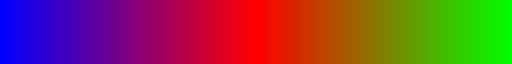

In [5]:
print("Default cmap")
display(plt.get_cmap("brg"))

In [6]:
diff_img = PIL.Image.open("cv_difficult.jpg")

Difficult image
Total confidence = 97.32035331108335.
Total confidence = 97.32035331108335


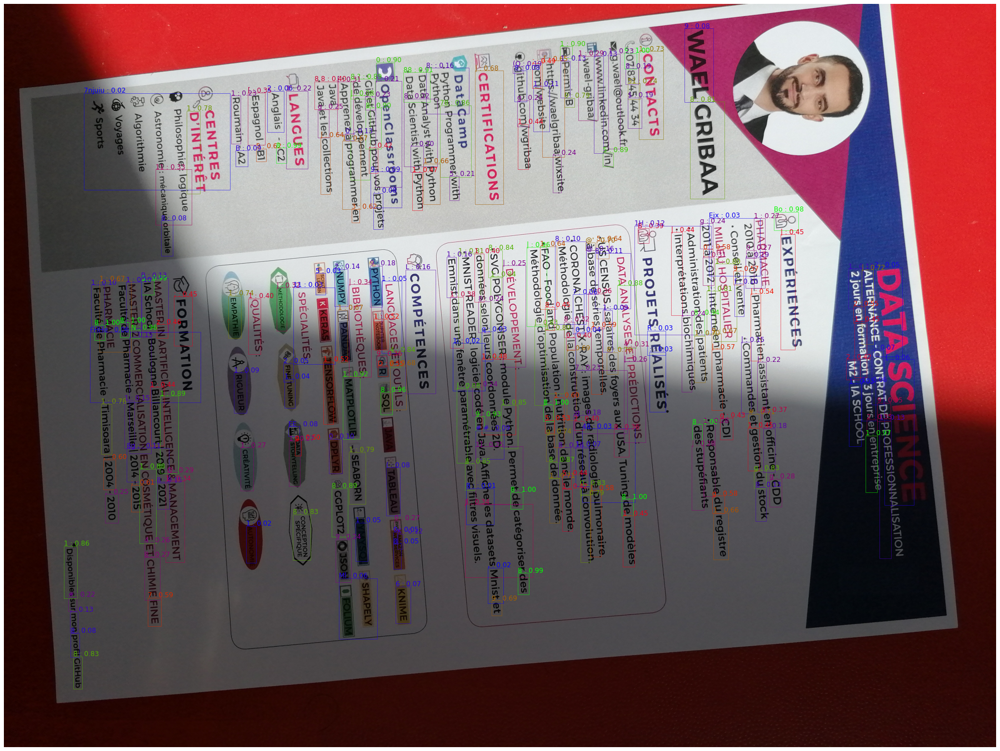

In [7]:
print("Difficult image")
pred_diff_img = predict(diff_img)

max_delta_angle set to 1 == 8 iterations.
Comparing angles 0 and 180.
Scores were:  [97.32035331108335, 108.48549788648461]
Comparing angles 90.0, 180 and 270.0.
Results :
	90.0 = 1617.5709142330913, 
	180 = 108.48549788648461, 
	270.0 = 702.035015561335.
Comparing angles 45.0, 90.0 and 135.0.
Results :
	45.0 = 851.6162419613835, 
	90.0 = 1617.5709142330913, 
	135.0 = 127.76848948365716.
Comparing angles 67.5, 90.0 and 112.5.
Results :
	67.5 = 1028.460660204195, 
	90.0 = 1617.5709142330913, 
	112.5 = 999.3653275516506.
Comparing angles 78.75, 90.0 and 101.25.
Results :
	78.75 = 1397.772506550356, 
	90.0 = 1617.5709142330913, 
	101.25 = 991.7446072980006.
Comparing angles 84.375, 90.0 and 95.625.
Results :
	84.375 = 4277.073819155301, 
	90.0 = 1617.5709142330913, 
	95.625 = 1092.5502538222509.
Comparing angles 81.5625, 84.375 and 87.1875.
Results :
	81.5625 = 3090.667093253517, 
	84.375 = 4277.073819155301, 
	87.1875 = 3051.3314130400718.
Comparing angles 82.96875, 84.375 and 85.78125.


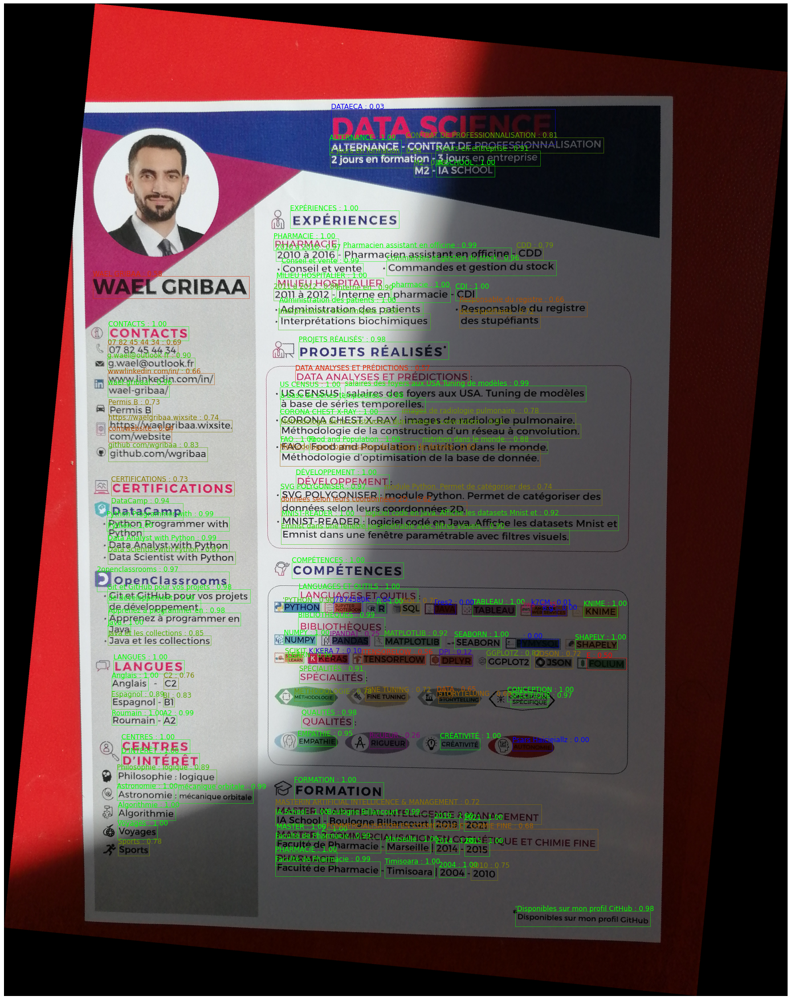

In [8]:
best_rotation_results = best_fine_rotation(diff_img, pred_diff_img, show_each = False)

In [9]:
unsure_masks = [result[2] <= 0.99 for result in best_rotation_results[2]]

In [10]:
crops = extract_crops(np.array(best_rotation_results[-1]), [res[0] for res in best_rotation_results[2]])

In [11]:
merged_results = []
for i,( crop, unsure_mask) in enumerate(zip(crops, unsure_masks)):
    compare = []
    enhanced_result = max_result(
        clean_result(reader.readtext(enhance4(crop))),
        clean_result(reader.readtext(enhance5(crop)))
    )

    if enhanced_result[2] is None or best_rotation_results[2][i][2] > enhanced_result[2]:
        merged_results.append(best_rotation_results[2][i])
    else:
        merged_results.append([best_rotation_results[2][i][0],
                              enhanced_result[1],
                             enhanced_result[2]])

Total confidence = 4432.057823937238


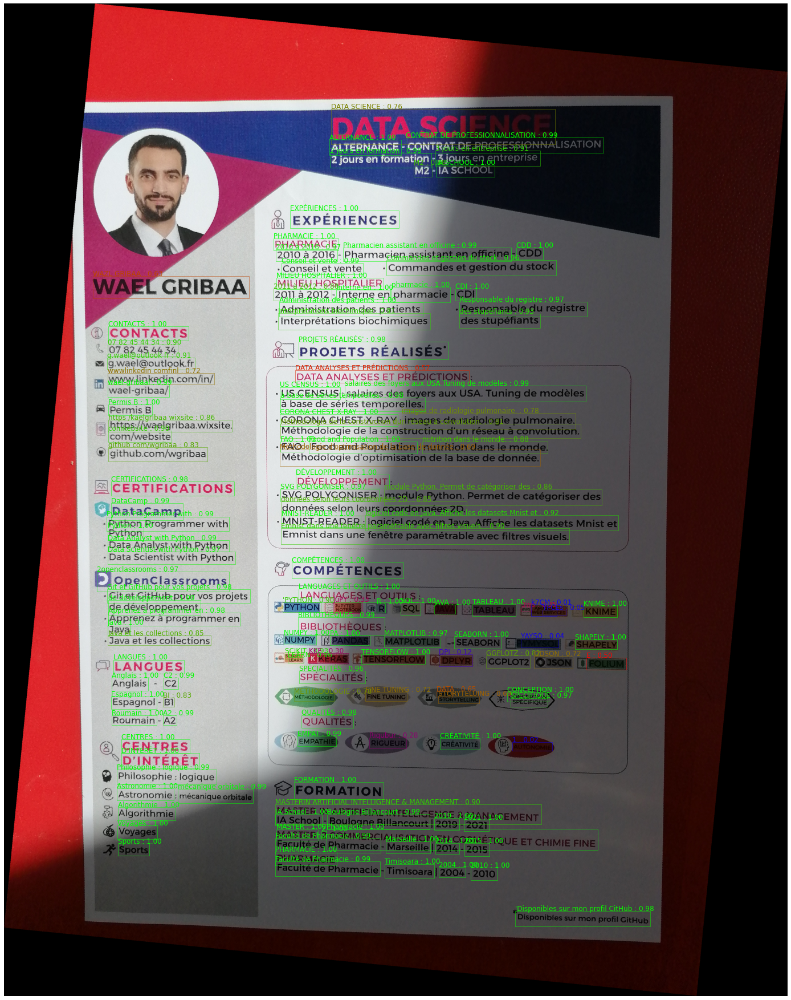

In [12]:
show_bboxes( merged_results, best_rotation_results[-1])

Total confidence went from 4277 to 4402.

# All in one function

In [13]:
def optimize_easyocr(image_or_path: str):
    img = PIL.Image.open(image_or_path) if isinstance(image_or_path, str) else image_or_path
    
    # Rotating 
    prime_results = best_fine_rotation(diff_img, pred_diff_img, show_each = False)
    
    # Extracting unsure crops
    unsure_masks = [result[2] <= 0.99 for result in prime_results[2]]
    crops = extract_crops(np.array(prime_results[-1]), [res[0] for res in prime_results[2]])
    
    merged_results = []
    for i,( crop, unsure_mask) in enumerate(zip(crops, unsure_masks)):
        compare = []
        
        # Applying preprocessing and selecting best result per crops
        enhanced_result = max_result(
            clean_result(reader.readtext(enhance4(crop))),
            clean_result(reader.readtext(enhance5(crop)))
        )
        
        # Merging selected best crops and results with original ones
        if enhanced_result[2] is None or prime_results[2][i][2] > enhanced_result[2]:
            merged_results.append(prime_results[2][i])
        else:
            merged_results.append([prime_results[2][i][0],
                                  enhanced_result[1],
                                 enhanced_result[2]])
    # Showing the prediction with updated results
    print("Optimized recognition")
    show_bboxes(merged_results, prime_results[-1])

max_delta_angle set to 1 == 8 iterations.
Comparing angles 0 and 180.
Scores were:  [97.32035331108335, 108.48549788648461]
Comparing angles 90.0, 180 and 270.0.
Results :
	90.0 = 1617.5709142330913, 
	180 = 108.48549788648461, 
	270.0 = 702.035015561335.
Comparing angles 45.0, 90.0 and 135.0.
Results :
	45.0 = 851.6162419613835, 
	90.0 = 1617.5709142330913, 
	135.0 = 127.76848948365716.
Comparing angles 67.5, 90.0 and 112.5.
Results :
	67.5 = 1028.460660204195, 
	90.0 = 1617.5709142330913, 
	112.5 = 999.3653275516506.
Comparing angles 78.75, 90.0 and 101.25.
Results :
	78.75 = 1397.772506550356, 
	90.0 = 1617.5709142330913, 
	101.25 = 991.7446072980006.
Comparing angles 84.375, 90.0 and 95.625.
Results :
	84.375 = 4277.073819155301, 
	90.0 = 1617.5709142330913, 
	95.625 = 1092.5502538222509.
Comparing angles 81.5625, 84.375 and 87.1875.
Results :
	81.5625 = 3090.667093253517, 
	84.375 = 4277.073819155301, 
	87.1875 = 3051.3314130400718.
Comparing angles 82.96875, 84.375 and 85.78125.


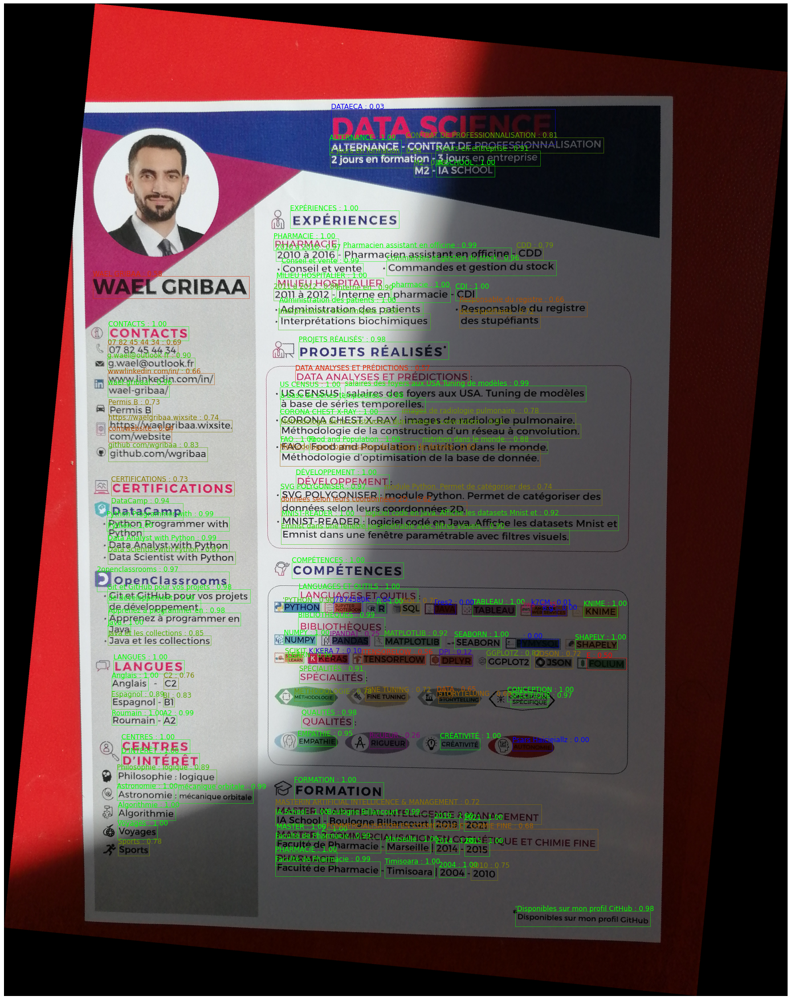

Optimized recognition
Total confidence = 4432.057823937238


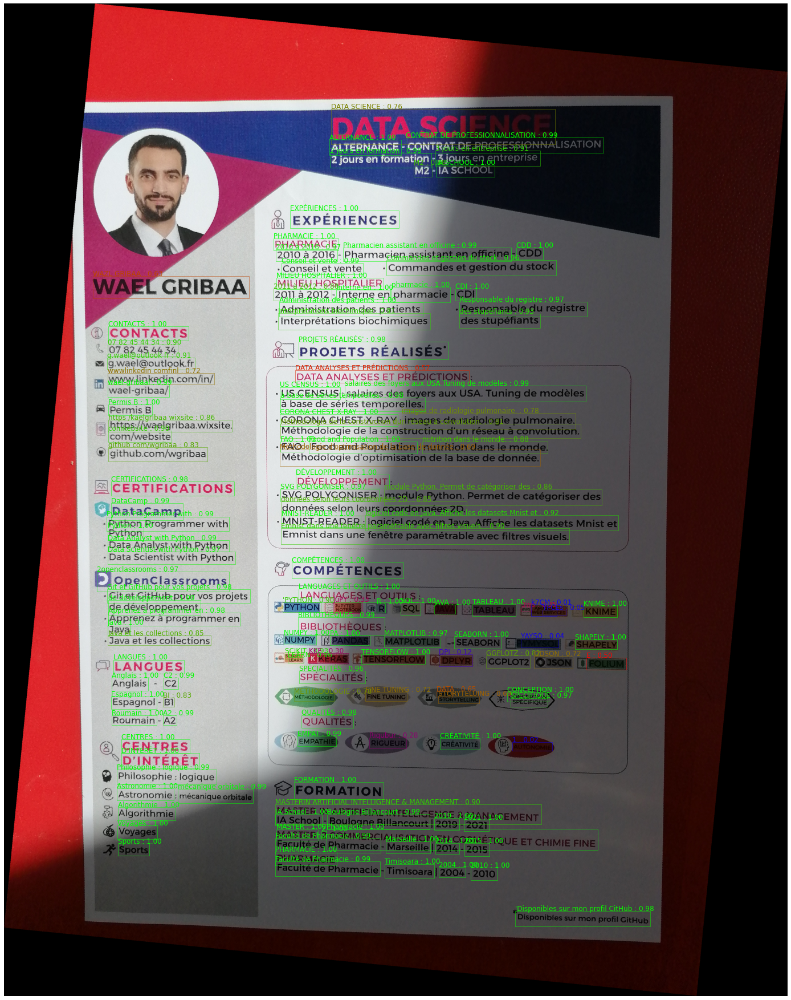

In [14]:
optimize_easyocr("cv_difficult.jpg")